<a href="https://colab.research.google.com/github/Yagwar/Proyectos/blob/master/Linkdin_contacts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import random
import time
import pickle
%matplotlib inline
import matplotlib.animation as animation
matplotlib.style.use('seaborn')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.decomposition import SparsePCA
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation

from sklearn import manifold
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from wordcloud import WordCloud
from sklearn.neighbors import kneighbors_graph

from mpl_toolkits.mplot3d import Axes3D

clrs_7=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#'#d9d9d9',

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
files_route="gdrive/My Drive/Freelancer/linkedin contacts/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
start_exec=time.time()

In [4]:
dat=pd.read_csv(files_route+"Connections.csv")
print(dat.columns)
dat["Connected On"]=pd.to_datetime(dat["Connected On"])

Index(['First Name', 'Last Name', 'Email Address', 'Company', 'Position',
       'Connected On'],
      dtype='object')


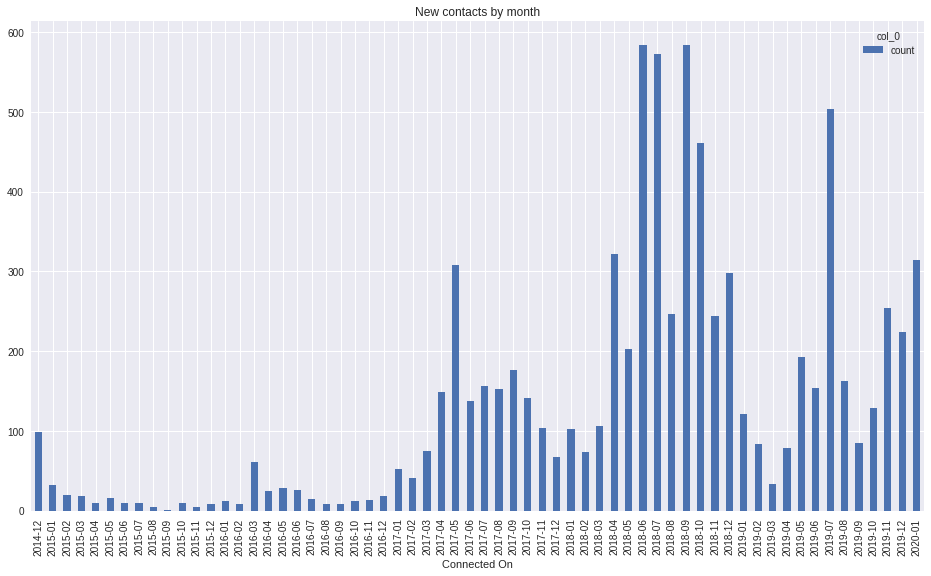

In [5]:
contact_date = pd.crosstab(index=dat["Connected On"].dt.to_period('m'),
                           columns="count")
contact_date.plot(kind="bar",figsize=(16,9), title="New contacts by month")#, cmap=clrs_7)

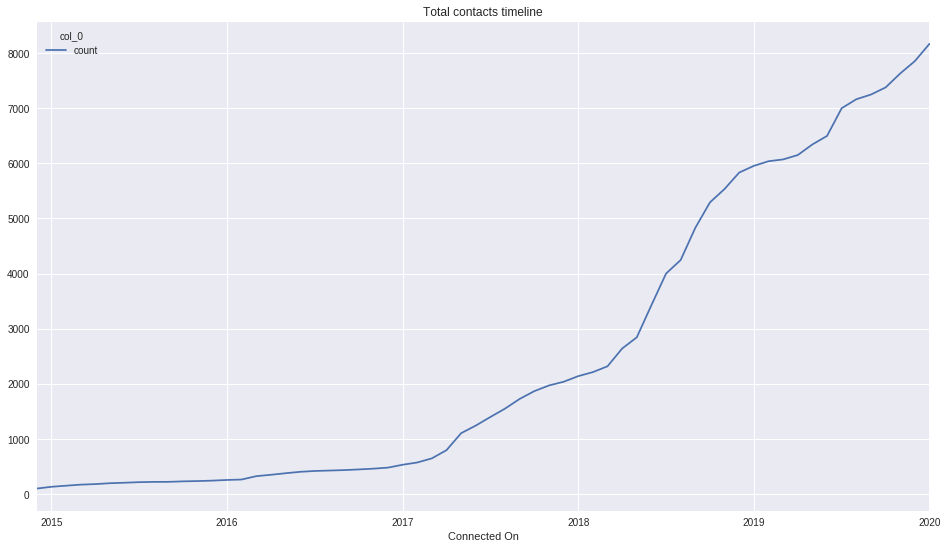

In [6]:
contact_date.cumsum().plot(figsize=(16,9),title="Total contacts timeline")#,cmap=clrs_7)
# plt.yscale('log')

In [0]:
dat["Description"]=dat["Company"]+" "+dat["Position"]

In [8]:
### Non Company Description Accounts
print("Proportion of Non Company Description Accounts: ", sum(pd.isna(dat["Description"]))/len(pd.isna(dat["Description"])))
data=dat.dropna(subset=["Description"])#(how='any')
print("Filtered Contacts", len(pd.isna(data["Description"])))
#dat.iloc(pd.isna(dat["Description"]))
data.shape

Proportion of Non Company Description Accounts:  0.0401468788249694
Filtered Contacts 7842


(7842, 7)

In [9]:
dat.shape

(8170, 7)

## preprocessing

In [0]:
stp_wrds=['de','en','del','la','las','sas','inc','in','of','the','el','los','ltda','com','ltd','and','llc',
     'para','san','sa','co','con','for','it','esp','eps','corp','at','av','sm','cia']

In [11]:
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7842, 8757)

In [12]:
#np.array([n_grams_counts.toarray().sum(axis=0),count_vect.get_feature_names()])
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '986']
 ['scientist' '542']
 ['analista' '504']
 ['colombia' '485']
 ['senior' '441']
 ['director' '422']
 ['manager' '408']
 ['universidad' '367']
 ['engineer' '336']
 ['gerente' '306']
 ['analyst' '258']
 ['business' '254']
 ['analytics' '237']
 ['consultant' '221']
 ['profesional' '205']
 ['software' '191']
 ['learning' '187']
 ['nacional' '187']
 ['jefe' '181']
 ['banco' '180']
 ['consultor' '177']
 ['selección' '177']
 ['research' '169']
 ['founder' '168']
 ['talento' '168']
 ['group' '167']
 ['science' '165']
 ['gestión' '162']
 ['docente' '161']
 ['desarrollo' '160']
 ['ceo' '157']
 ['talent' '152']
 ['grupo' '147']
 ['machine' '143']
 ['digital' '142']
 ['developer' '140']
 ['humano' '140']
 ['lead' '136']
 ['coordinador' '135']
 ['comercial' '129']
 ['ai' '125']
 ['psicóloga' '124']
 ['seguros' '122']
 ['head' '119']
 ['marketing' '117']
 ['coordinadora' '115']
 ['intelligence' '112']
 ['humana' '112']
 ['specialist' '110']
 ['universitaria' '110']]


### Diccionario de normalización de términos

In [13]:
esp_words=[ 'universidad', 'nacional', 'banco', 'grupo', 'universitaria', 'fundación', 'seguros',
 'independiente', 'salud', 'corporación', 'centro', 'instituto', 'servicios', 'colegio',
 'consultores', 'pontificia', 'oficial', 'distrital', 'andina', 'educación', 'secretaria',
 'agencia', 'colombiana', 'católica', 'escuela', 'departamento',
 'humano', 'secretaría', 'soluciones', 'estadística',
 'organización', 'clínica', 'ministerio', 'seguridad', 'desarrollo', 'empresarial', 'fundacion', 'fundación',
 'integral', 'internacional', 'administrativo', 'casa', 'editorial', 'minuto',
 'talento', 'valle', 'universidade', 'consultoría', 'ingeniería', 'santo', 'gimnasio',
 'comercializadora', 'colombiano', 'servicio',
 'ejercito', 'investigación', 'tiempo', 'vida', 'alcaldia', 'fondo', 'bienestar',
 'inversiones', 'caja', 'consultoria', 'rosario', 'occidente', 'financiera', 'alianza', 'clinica',
 'asociados', 'nivel', 'bosque', 'corredores', 'tecnología',
 'psicología','psicologia', 'generales', 'hogar', 'estudios', 'comercial',
 'compañía', 'latinoamericana', 'particular', 'empleo', 'comercio', 'professional',
 'digital', 'alcaldía', 'unidad', 'ventas', 'financieros', 'empresa', 'gestión', 'industria',
 'industriales', 'empresariales', 'pedagógica', 'república', 'norte', 'consultora',
 'mercantil', 'asociación', 'comunicaciones', 'asesorías',
 'consultor', 'terciarios', 'área', 'integración', 'artificial', 'cooperativa',
 'transportes','freelance','freelancer','consultant', 'datos',
 'analista','análisis','gerente','profesional','selección','seleccion','humanos',
 'psicólogo','psicóloga','psicologo','psicologa','psychologist','directora',
 'estadístico','estadística','estadistico','analyst','científico','científica','ciencia',
 'operaciones','riesgo', 'procesos','desarrollador', 'mercadeo','profesor','profesora', 'docente',
 'cátedra','catedrático','catedrática','analítica','ventas'] 

eng_words=['university', 'national', 'bank', 'group', 'university', 'foundation', 'insurance',
 'independent', 'health', 'corporation', 'center', 'institute', 'services', 'school',
 'consultancy', 'pontifical', 'official', 'district', 'andean', 'education', 'secretary',
 'agency', 'colombian', 'catholic', 'school', 'department',
 'human', 'secretary', 'solutions', 'statistics',
 'organization', 'clinic', 'ministry', 'security', 'development', 'business', 'foundation', 'foundation',
 'integral', 'international', 'administrative', 'house', 'editorial', 'minute',
 'talent', 'valley', 'university', 'consulting', 'engineering', 'saint', 'gym',
 'sales', 'colombian', 'servicio',
 'army', 'research', 'time', 'life', 'mayor', 'fund', 'wellness',
 'investments', 'box', 'consultancy', 'rosary', 'occident', 'financial', 'alliance', 'clinic',
 'associates', 'level', 'forest', 'broker', 'technology',
 'psychology','psychology', 'generals', 'home', 'studies', 'commercial',
 'company', 'latam', 'private', 'employment', 'commerce', 'professional',
 'digital', 'mayor', 'unit', 'sales', 'financial', 'company', 'management', 'industry',
 'industry', 'business', 'pedagogical', 'republic', 'north', 'consultancy',
 'mercantile', 'association', 'communications', 'consultancy',
 'consultancy', 'tertiary', 'area', 'integration', 'artificial', 'cooperative',
 'transport','consultancy','consultancy','consultancy','data',
 'analysis','analysis','manager','professional','selection','selection','human',
 'psychology','psychology','psychology','psychology','psychology','director',
 'statistics','statistics','statistics','analysis','scientist','scientist','science',
 'operations','risk','process','developer','marketing','professor','professor','professor',
 'professor','professor','professor','analytics','sales']
len(esp_words)==len(eng_words)

True

In [14]:
print("START lower case and unify most frequent words languaje")
for i in data.Description.index:
    jb_desc=str(data.Description[i]).lower()
    for n_wd in range (len (esp_words)):
        jb_desc = jb_desc.replace(esp_words[n_wd], eng_words[n_wd])
    data.Description[i]=jb_desc
#     print(i)
print("END")

START lower case and unify most frequent words languaje


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


END


In [15]:
# Repeat vectorization after replacement frequent terms
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7842, 8613)

In [0]:
# data.sample(25)

In [17]:
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '1094']
 ['analysis' '801']
 ['manager' '714']
 ['consultancy' '632']
 ['scientist' '589']
 ['university' '574']
 ['director' '529']
 ['colombia' '485']
 ['senior' '441']
 ['psychology' '405']
 ['engineer' '336']
 ['talent' '320']
 ['group' '314']
 ['professor' '302']
 ['business' '296']
 ['analytics' '281']
 ['development' '254']
 ['management' '246']
 ['research' '241']
 ['professional' '233']
 ['selection' '216']
 ['human' '215']
 ['national' '206']
 ['bank' '199']
 ['software' '191']
 ['learning' '187']
 ['jefe' '181']
 ['science' '172']
 ['founder' '168']
 ['developer' '162']
 ['ceo' '157']
 ['marketing' '150']
 ['services' '148']
 ['insurance' '147']
 ['machine' '143']
 ['digital' '142']
 ['commercial' '140']
 ['statistics' '139']
 ['lead' '136']
 ['coordinador' '135']
 ['foundation' '134']
 ['ai' '125']
 ['international' '122']
 ['consulting' '122']
 ['solutions' '121']
 ['head' '119']
 ['coordinadora' '115']
 ['humana' '112']
 ['intelligence' '112']
 ['independent' '11

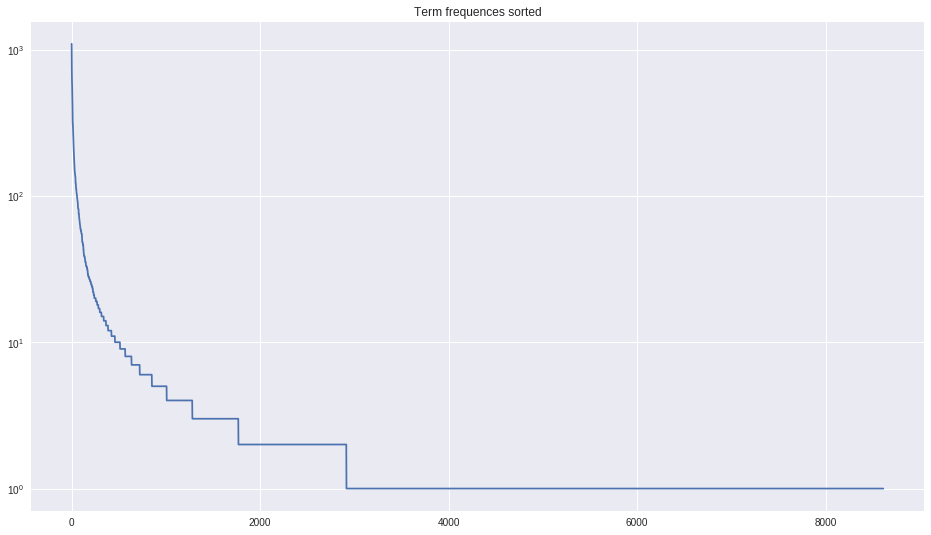

In [18]:
plt.figure(figsize=(16,9))
plt.plot(txt_freqs[indices])
plt.title("Term frequences sorted")
#txt_freqs[indices[:top_n]]
plt.yscale('log')

Text(0.5, 1.0, 'Terms count by profile')

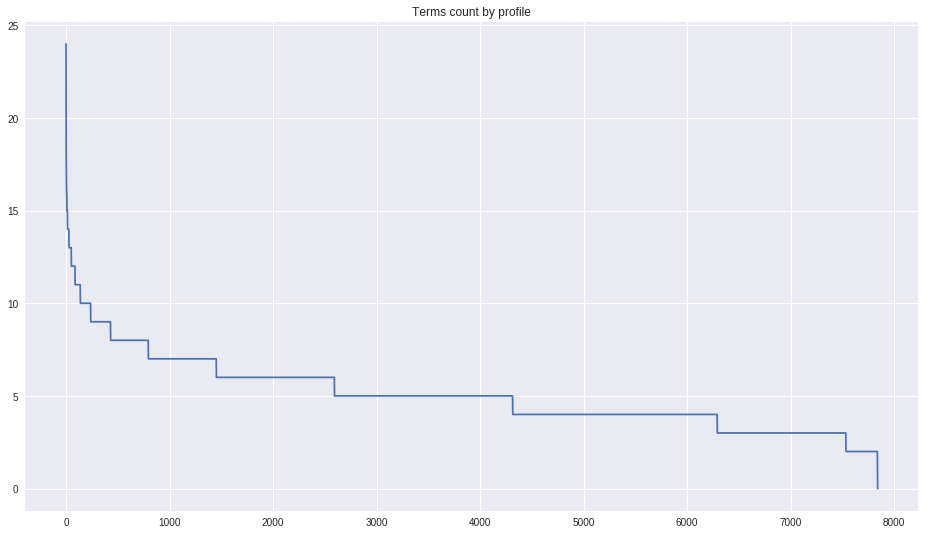

In [19]:
cntc_freqs= n_grams_counts.toarray().sum(axis=1)
cntc_indices = np.argsort(cntc_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
plt.figure(figsize=(16,9))
plt.plot(cntc_freqs[cntc_indices])
plt.title("Terms count by profile")
#txt_freqs[indices[:top_n]]
# plt.yscale('log')

col_0  count
row_0       
0          2
1          1
2        305
3       1243
4       1976
5       1722
6       1141
7        657
8        365
9        192
10       100
11        51
12        36
13        23
14        14
15         6
16         3
17         2
18         1
20         1
24         1


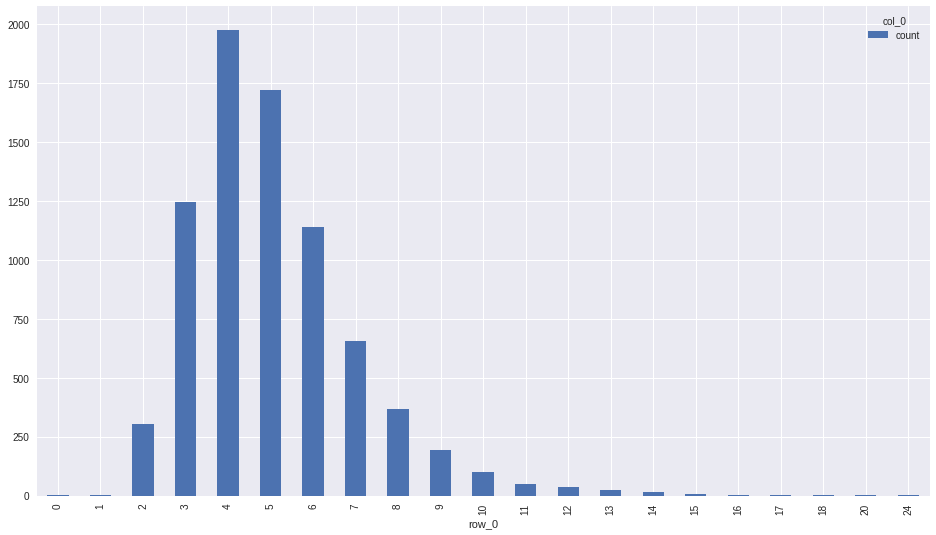

In [20]:
print(pd.crosstab(index=cntc_freqs, columns="count"))
pd.crosstab(index=cntc_freqs, columns="count").plot(kind="bar",figsize=(16,9))#/3409
#(cntc_freqs)

In [21]:
tfidf_transformer = TfidfVectorizer(stop_words=stp_wrds)
n_grams_tfidf = tfidf_transformer.fit_transform(data["Description"])
n_grams_tfidf.shape

(7842, 8613)

Text(0.5, 1.05, 'Term-frequence matrix')

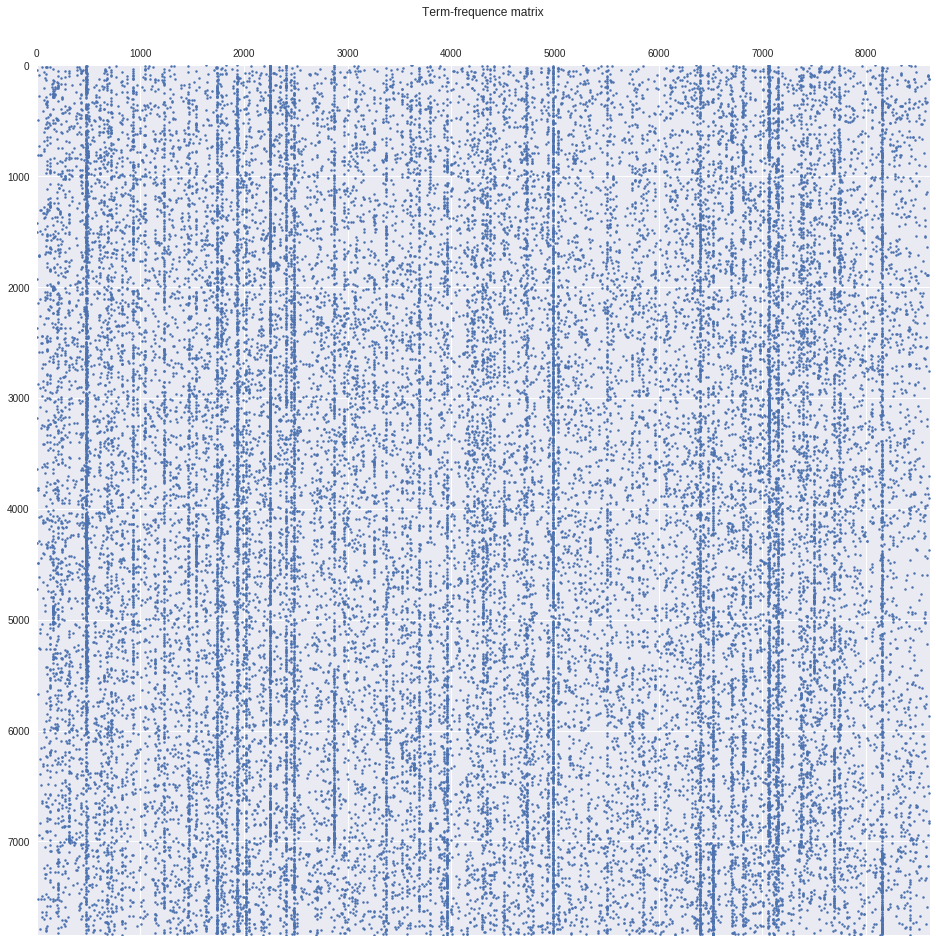

In [22]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_counts,markersize=2.5, marker="o",aspect='auto')
plt.title("Term-frequence matrix")

In [0]:
# plt.figure(figsize=(16,16))
# plt.spy(n_grams_tfidf,markersize=2.5, marker="o",aspect='auto')#,markersize=3
# plt.title("tf-idf matrix")

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


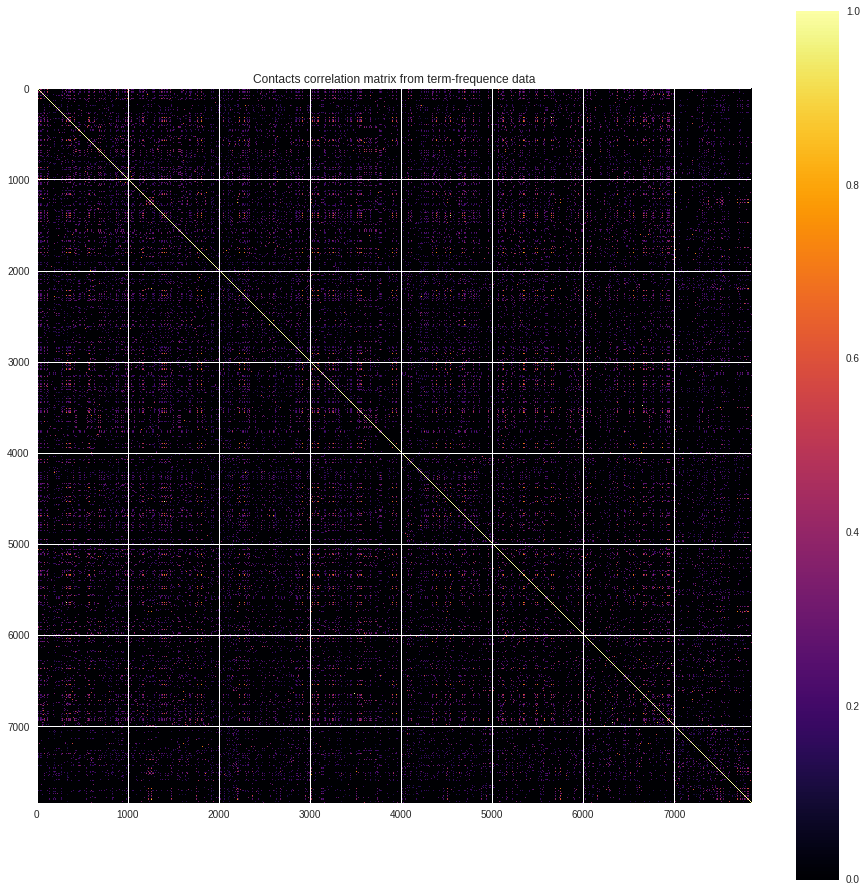

In [24]:
plt.figure(figsize=(16,16))
plt.imshow(np.corrcoef(n_grams_counts.toarray()), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from term-frequence data")
plt.colorbar()
plt.show()


# Latent Dirichlet Allocation embedding Ward and DB-scan culstering

## Topic extraction LDA

In [0]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)
    print()


In [26]:
lda = LatentDirichletAllocation(n_components=50, max_iter=15,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)
lda.fit(n_grams_counts)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=50.0,
                          max_doc_update_iter=100, max_iter=15,
                          mean_change_tol=0.001, n_components=50, n_jobs=None,
                          perp_tol=0.1, random_state=0, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [27]:
print("\nTopics in LDA model:")
tf_feature_names = count_vect.get_feature_names()
print_top_words(lda, tf_feature_names, 15)


Topics in LDA model:
Topic #0: colombia management national analysis foundation statistics coordinadora humana risk services chile university administrative gestion department
Topic #1: psychology professional clinic social clínico mayor crédito hospital cundinamarca ii fund neuropsychology ips sede jurídica
Topic #2: data scientist senior group analysis big recruiter scotiabank lead technical lider bbva services sr colpatria
Topic #3: intern india chairman citi summer tmark economics altran despachador panasonic wipro franklin abb competitive clearing
Topic #4: coordinador solutions school engineering web amazon services applied republic professora designer ux ingenieros application programas
Topic #5: security life studies investments tecnico propietario energía unión doctorado speaker erasmus publica nomina eléctrica facilitador
Topic #6: nueva beneficios addactis isapre militar jefa consulente dubai conhealth granada colmena 1a pt compensaciones libero
Topic #7: ecopetrol aprendiz

In [0]:
LDA_embedd=lda.transform(n_grams_counts)

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


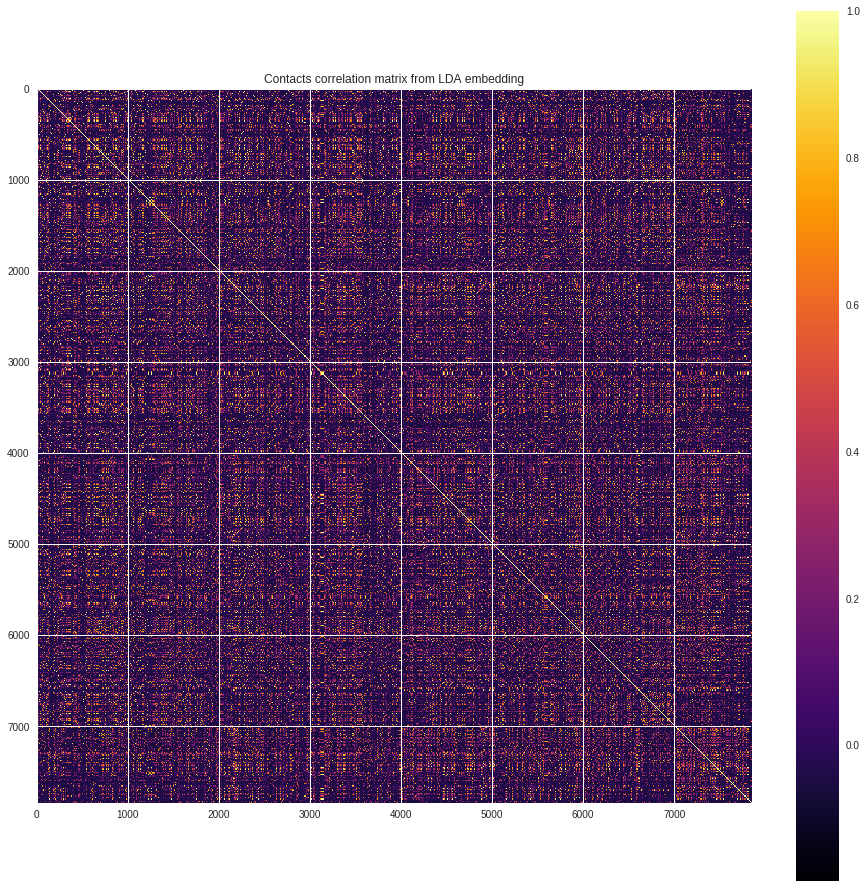

In [29]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(LDA_embedd), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from LDA embedding")
plt.colorbar()
plt.show()

## DBScan CLustering

In [0]:
dist_mat_LDA=pairwise_distances(LDA_embedd)

In [0]:
dist_vec_LDA=dist_mat_LDA.flatten()

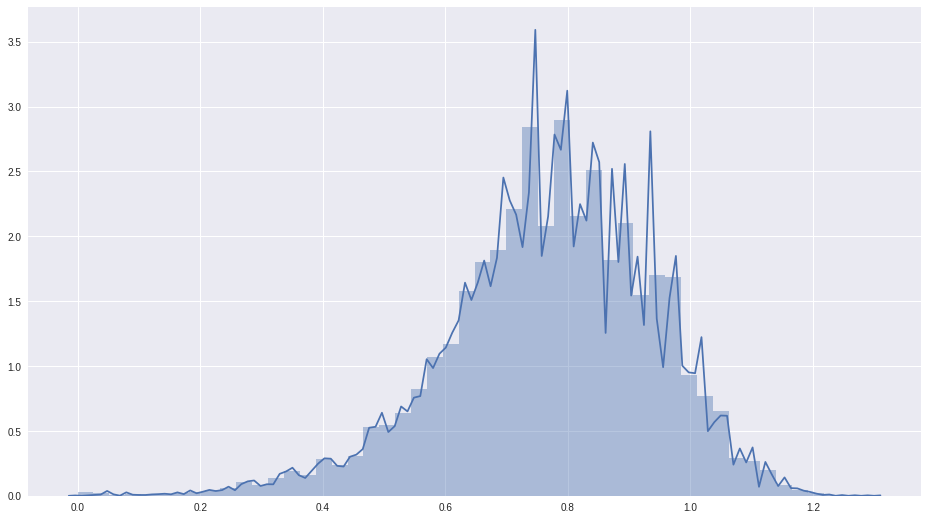

In [32]:
plt.figure(figsize=(16,9))
# plt.hist(n_grams_tfidf_dist_mat.flatten())
sns.distplot(dist_vec_LDA)
# sns.kdeplot()

In [0]:
freq_dists_LDA=pd.crosstab(index=np.round_(dist_vec_LDA,3), columns="count")

col_0  count
row_0       
0.000  48650
0.001     68
0.002     40
0.003      8
0.004     10
...      ...
0.297   3784
0.298   2670
0.299   2334
0.300  20980
0.301   2384

[300 rows x 1 columns]


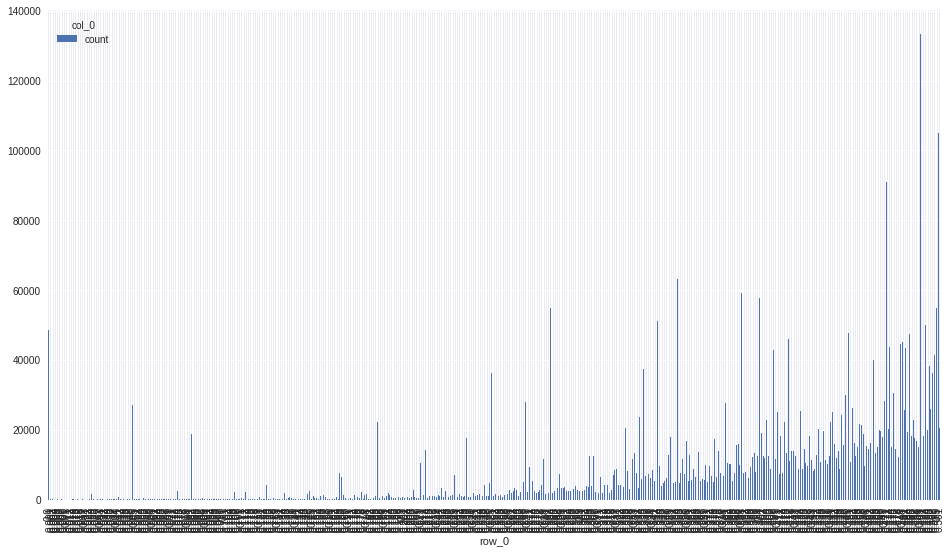

In [34]:
print(freq_dists_LDA.iloc[:300,:])#.iloc[:50,:])
freq_dists_LDA.iloc[:500,:].plot(kind="bar",figsize=(16,9))#.iloc[:150,:]

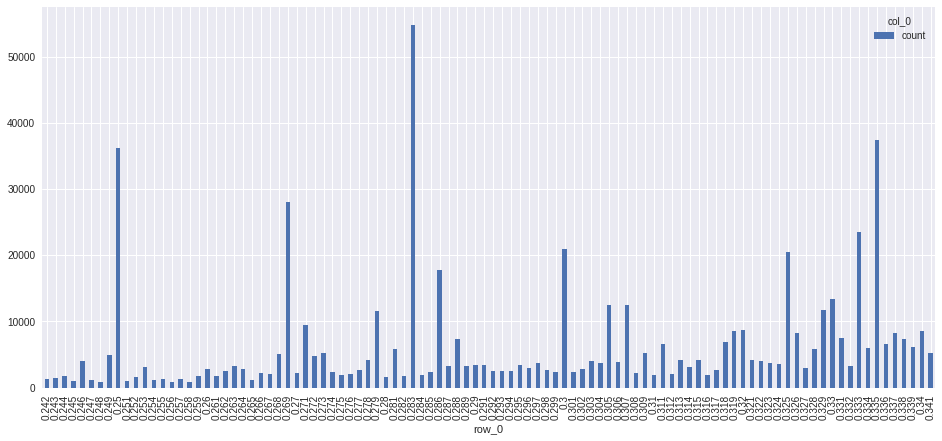

In [35]:
freq_dists_LDA.iloc[240:340,:].plot(kind="bar",figsize=(16,7))#.iloc[:150,:]

col_0,count
row_0,
-1,3397
0,203
1,1509
2,1439
3,152
4,277
5,138
6,260
7,319


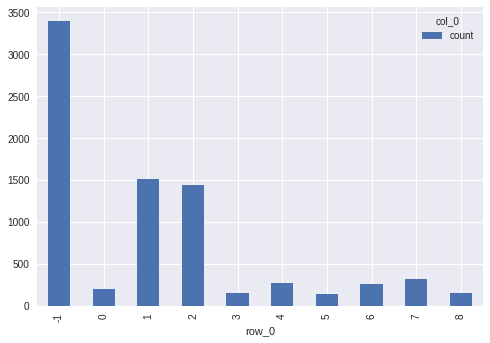

In [36]:
db_scan_LDA = DBSCAN(eps=.293, min_samples=100).fit(LDA_embedd)#.285#293#275
LDA_db_labels = db_scan_LDA.labels_
pd.crosstab(index=LDA_db_labels, columns="count").plot(kind="bar")
pd.crosstab(index=LDA_db_labels, columns="count")

## Dendrogram (Ward) Clustering

In [0]:
contacts_ward_LDA=hierarchy.linkage(LDA_embedd, 'ward')

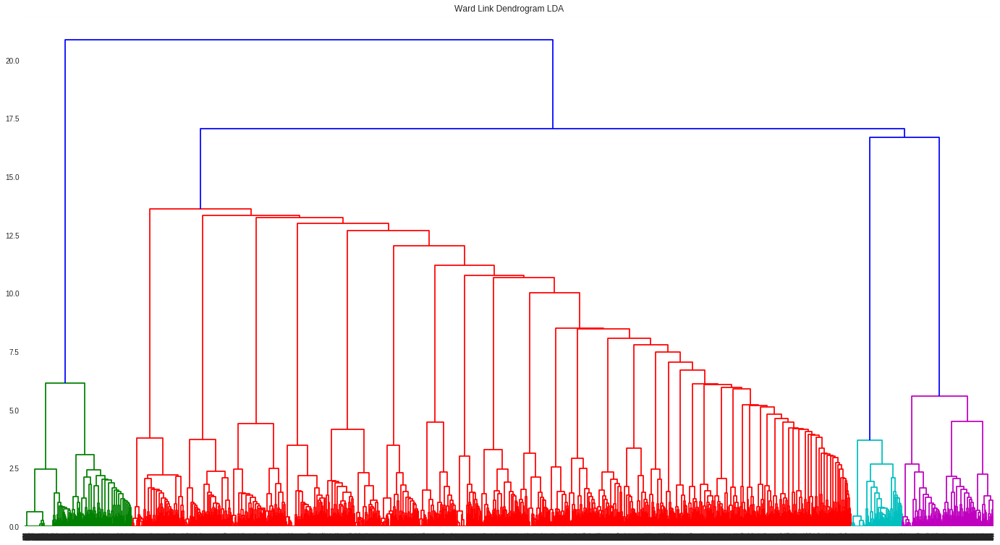

In [38]:
plt.figure(figsize=(24,13))#15,35
dn_tf = hierarchy.dendrogram(contacts_ward_LDA)#,orientation="left")
plt.title('Ward Link Dendrogram LDA')
plt.show()

In [0]:
connectivity = kneighbors_graph(LDA_embedd, n_neighbors=15, include_self=False)

In [40]:
clustering_30d_ward = AgglomerativeClustering(linkage='ward', n_clusters=15,connectivity=connectivity)
# clustering_12d_ward.fit(spect_emb_tfidf_12d)
clustering_30d_ward.fit(LDA_embedd)
# clustering.fit(n_grams_tfidf.toarray())

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 8 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=<7842x7842 sparse matrix of type '<class 'numpy.float64'>'
	with 117630 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='ward', memory=None,
                        n_clusters=15)

In [41]:
pd.crosstab(index=clustering_30d_ward.labels_, columns="count")

col_0,count
row_0,
0,2672
1,810
2,384
3,642
4,352
5,294
6,397
7,378
8,426


# Cluster Exploration

In [42]:
pd.crosstab(index=clustering_30d_ward.labels_, columns=LDA_db_labels, margins=True)

col_0,-1,0,1,2,3,4,5,6,7,8,All
row_0,,,,,,,,,,,
0,2303,37,68,257,0,1,4,0,2,0,2672
1,61,0,746,0,0,0,0,1,2,0,810
2,98,0,15,6,0,265,0,0,0,0,384
3,127,7,20,486,1,0,1,0,0,0,642
4,88,0,256,6,0,0,0,0,0,2,352
5,137,0,6,4,0,0,1,1,0,145,294
6,45,0,352,0,0,0,0,0,0,0,397
7,103,0,7,2,1,8,0,257,0,0,378
8,95,0,8,323,0,0,0,0,0,0,426


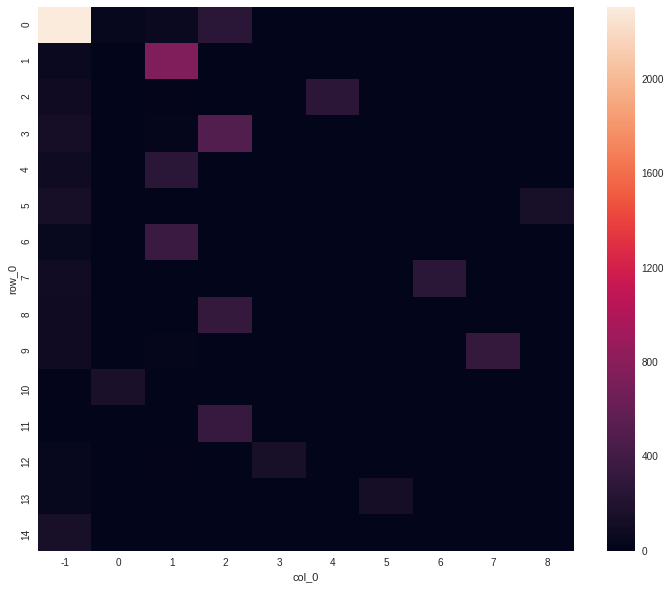

In [43]:
plt.figure(figsize=(12,10))
sns.heatmap(pd.crosstab(index=clustering_30d_ward.labels_, columns=LDA_db_labels, margins=False))

## Visualization

In [0]:
spect_emb_tfidf_3=manifold.SpectralEmbedding(n_components=3, n_jobs=-1).fit_transform(LDA_embedd)

In [0]:
spect_emb_tfidf_3=1000*spect_emb_tfidf_3

### DB Scan

In [0]:
# spect_emb_tfidf_3_denoised=LDA_embedd[LDA_db_labels>=0,:]
spect_emb_tfidf_3_denoised=spect_emb_tfidf_3[LDA_db_labels>=0,:]
LDA_db_labels_denoised=LDA_db_labels[LDA_db_labels>=0]

Text(0.5, 1.0, '2d spectral coordinates from 30D DB clusters')

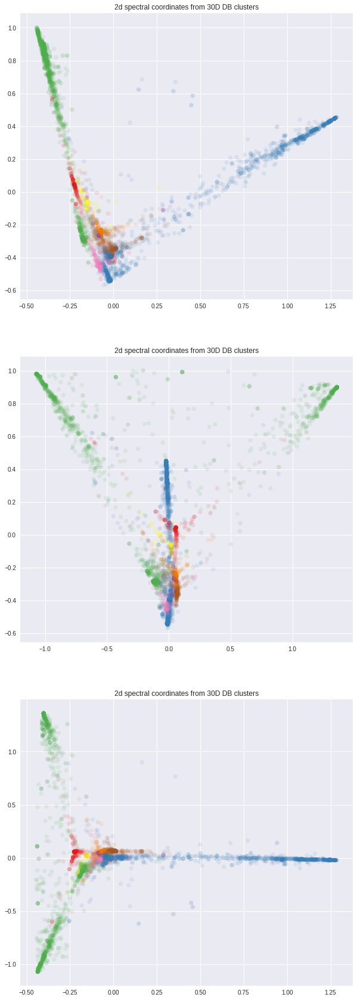

In [47]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3_denoised[:,0],spect_emb_tfidf_3_denoised[:,1], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3_denoised[:,2],spect_emb_tfidf_3_denoised[:,1], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3_denoised[:,0],spect_emb_tfidf_3_denoised[:,2], alpha=par_alf,s=45, c=LDA_db_labels_denoised, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D DB clusters")

Text(0.5, 0.92, '3D spectral coordinates from 30D LDA embedding DBscan clusters')

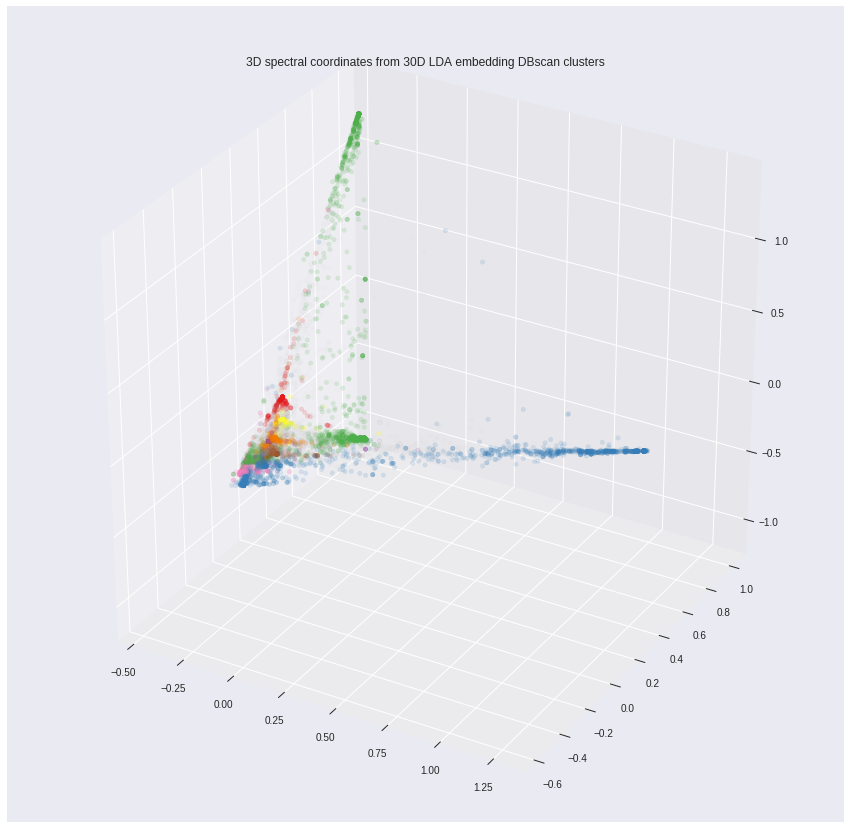

In [48]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3_denoised[:,0],
           spect_emb_tfidf_3_denoised[:,1],
           spect_emb_tfidf_3_denoised[:,2],
           c=LDA_db_labels_denoised, 
           alpha=0.15,
           cmap=plt.cm.Set1)
ax.scatter(spect_emb_tfidf_3[LDA_db_labels==-1,0],
           spect_emb_tfidf_3[LDA_db_labels==-1,1],
           spect_emb_tfidf_3[LDA_db_labels==-1,2],
           c="lightgrey", 
           alpha=0.05)

plt.title("3D spectral coordinates from 30D LDA embedding DBscan clusters")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


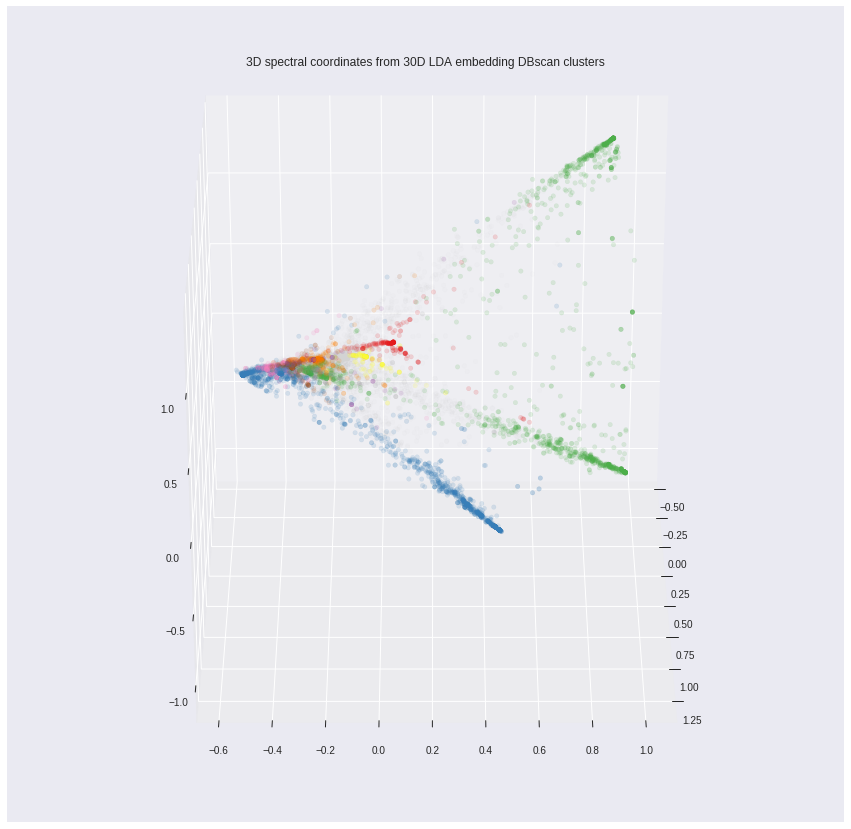

In [49]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3_denoised[:,0],
           spect_emb_tfidf_3_denoised[:,1],
           spect_emb_tfidf_3_denoised[:,2],
           c=LDA_db_labels_denoised, 
           alpha=0.15,
           cmap=plt.cm.Set1)
ax.scatter(spect_emb_tfidf_3[LDA_db_labels==-1,0],
           spect_emb_tfidf_3[LDA_db_labels==-1,1],
           spect_emb_tfidf_3[LDA_db_labels==-1,2],
           c="lightgrey", 
           alpha=0.05)

plt.title("3D spectral coordinates from 30D LDA embedding DBscan clusters")
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'DB_clustering_axis_LDAEmbedd_SpectCoords.gif', dpi=80, writer='imagemagick')

### Dendrogram (Ward)

Text(0.5, 1.0, '2d spectral coordinates from 30D Ward clusters')

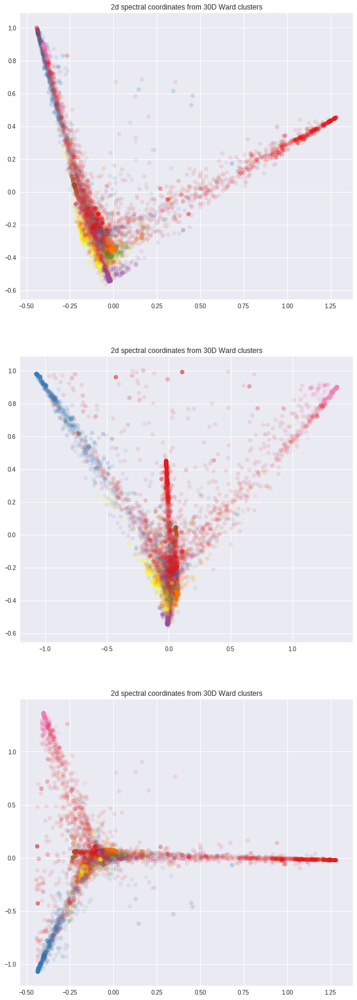

In [50]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 30D Ward clusters")

Text(0.5, 0.92, '3D spectral coordinates from 30D LDA embedding Ward clusters')

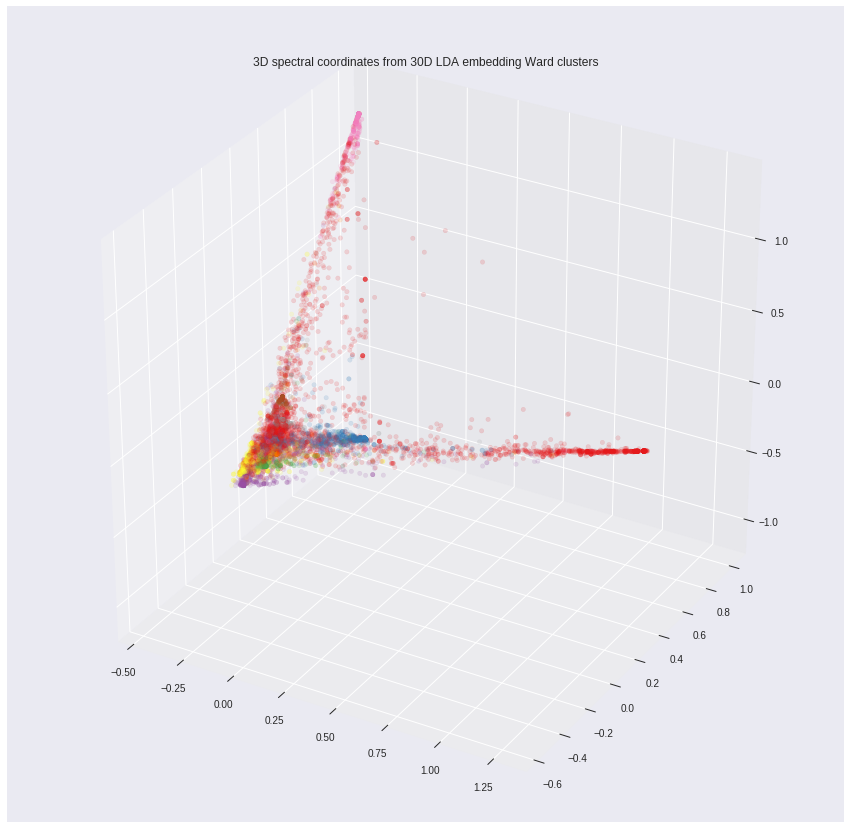

In [51]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3[:,0],
           spect_emb_tfidf_3[:,1],
           spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)

plt.title("3D spectral coordinates from 30D LDA embedding Ward clusters")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


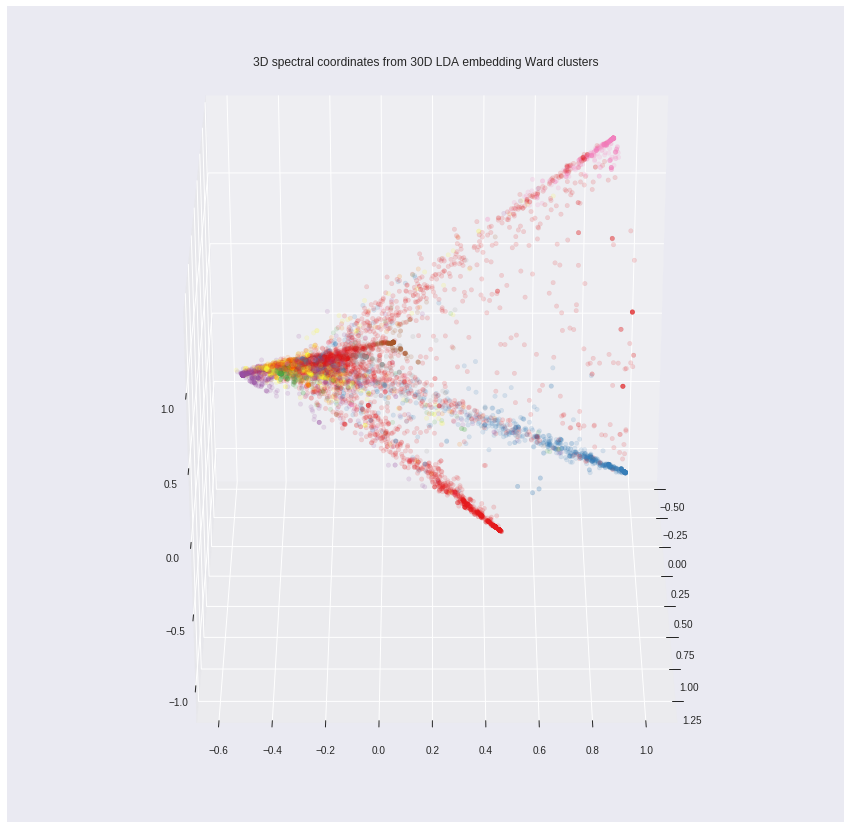

In [52]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(spect_emb_tfidf_3[:,0],
           spect_emb_tfidf_3[:,1],
           spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)

plt.title("3D spectral coordinates from 30D LDA embedding Ward clusters")
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'Ward_clustering_axis_LDAEmbedd_SpectCoords.gif', dpi=80, writer='imagemagick')

## Word Cloud

In [0]:
fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#'#a50026',
                                                                     '#d73027',
                                                                     '#f46d43',
                                                                     '#fdae61',
#                                                                      '#fee090',
#                                                                      '#ffffbf',
#                                                                      '#e0f3f8',
#                                                                      '#abd9e9',
                                                                     '#74add1',
                                                                     '#4575b4',
                                                                     '#313695'])

In [54]:
pic_wide=900
wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
wc.generate_from_frequencies(fr_dic)

(-0.5, 899.5, 384.5, -0.5)

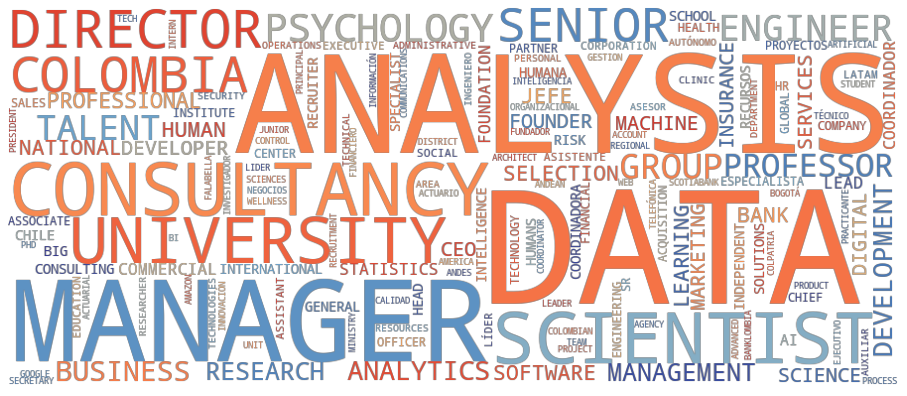

In [55]:
plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
# plt.savefig('wrdcld.png')

In [0]:
def wrd_cld_dic_clust(clust_labels,clust_id,top_n=300,pic_wide=900):
    txt_freqs= n_grams_counts.toarray()[clust_labels==clust_id].sum(axis=0)
    indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
    features =count_vect.get_feature_names()# vectorizer.get_feature_names()
    # top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
    top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
    fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
    wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
    wc.generate_from_frequencies(fr_dic)
    return wc


### Wordcloud Ward

(-0.5, 899.5, 384.5, -0.5)

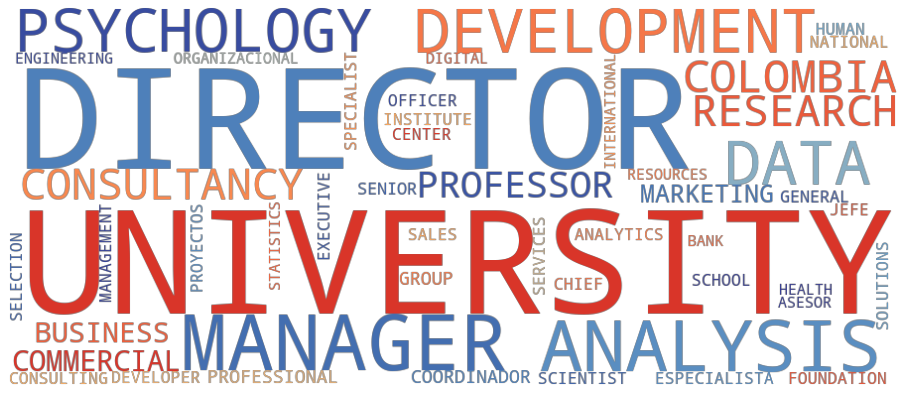

In [57]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

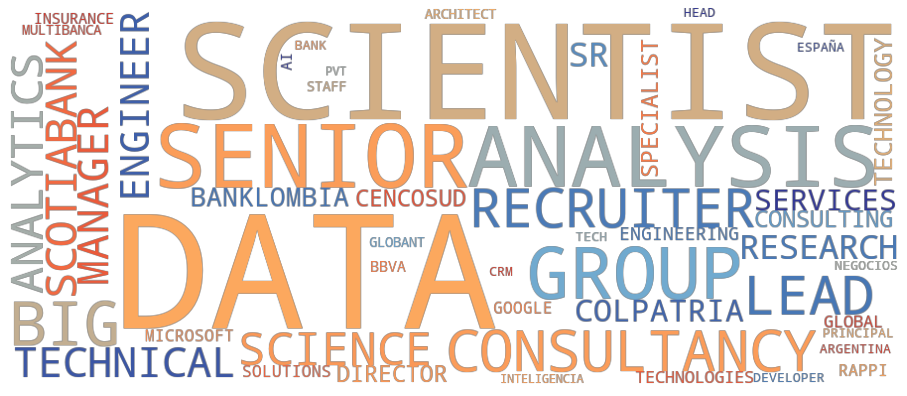

In [58]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

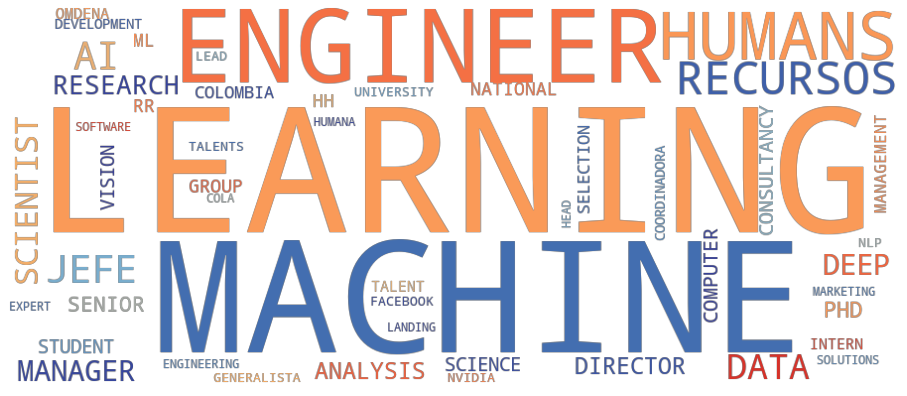

In [59]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,2,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

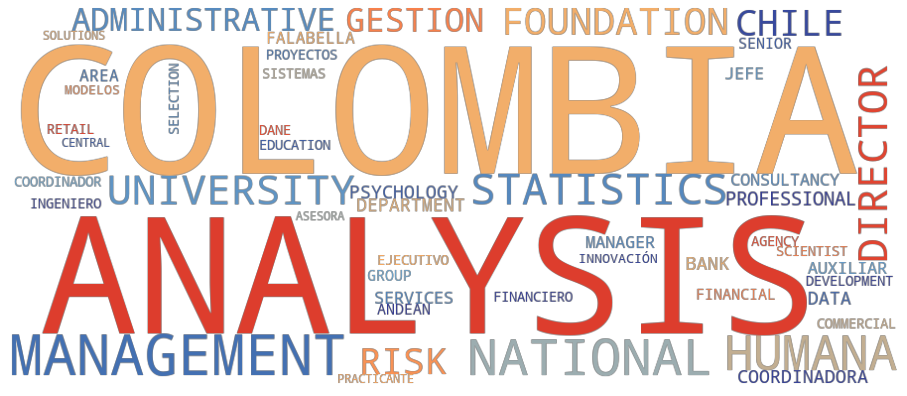

In [60]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,3,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

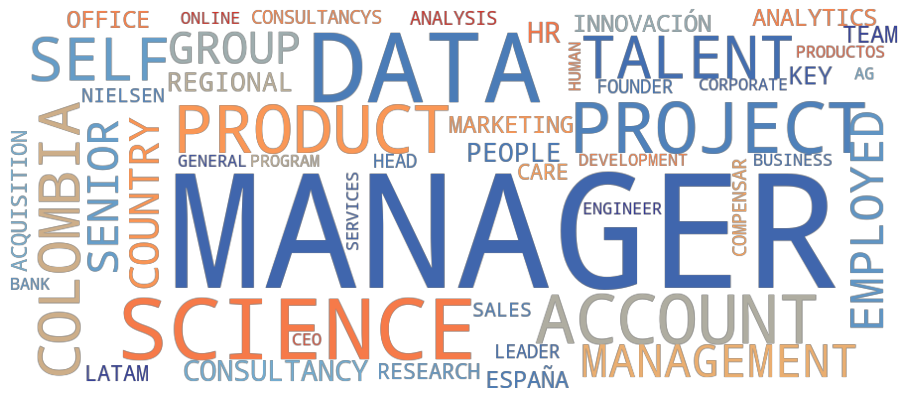

In [61]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,4,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

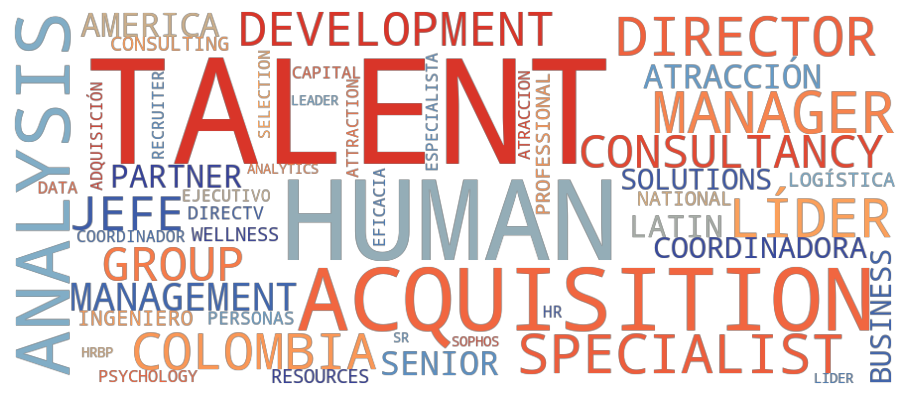

In [62]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,5,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

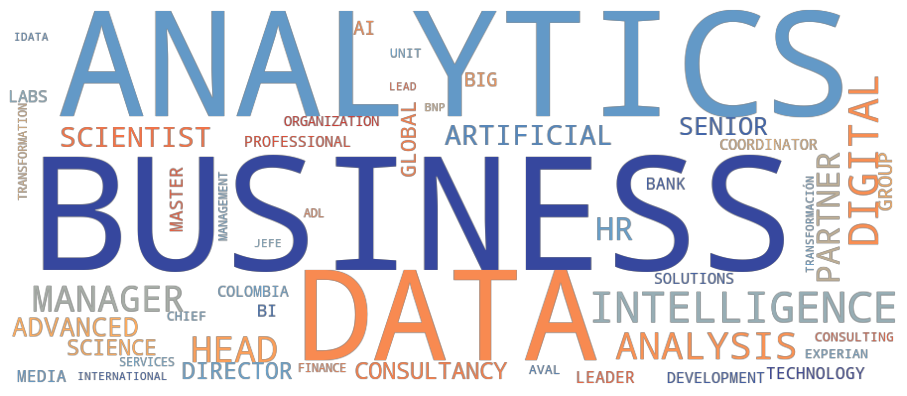

In [63]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,6,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

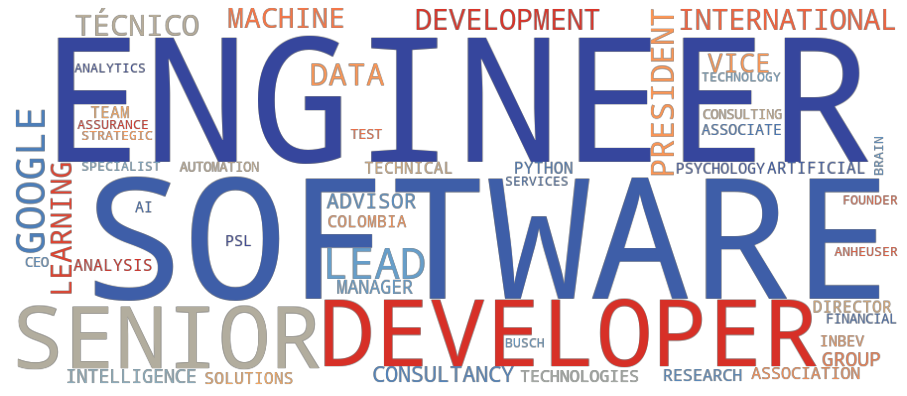

In [64]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,7,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

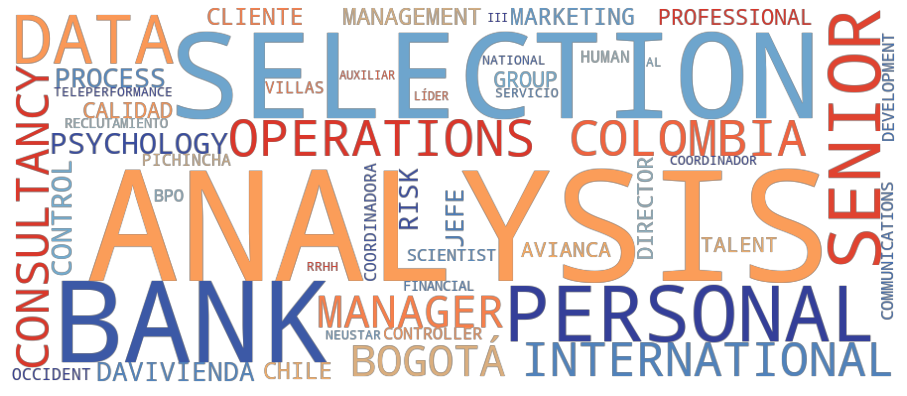

In [65]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,8,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

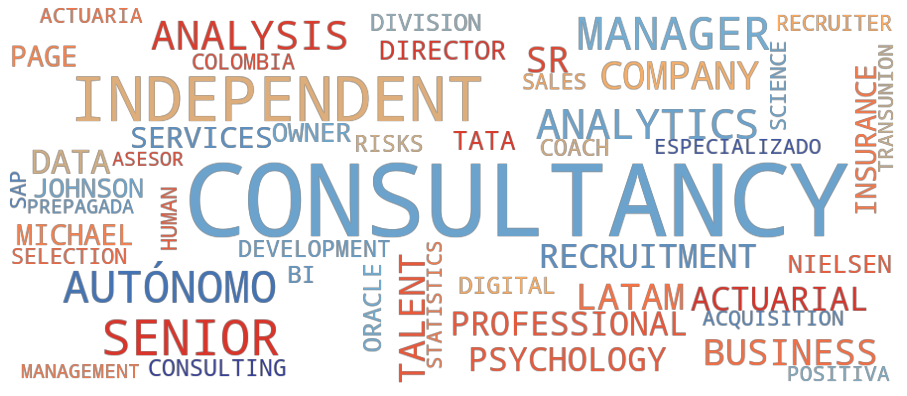

In [66]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,9,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

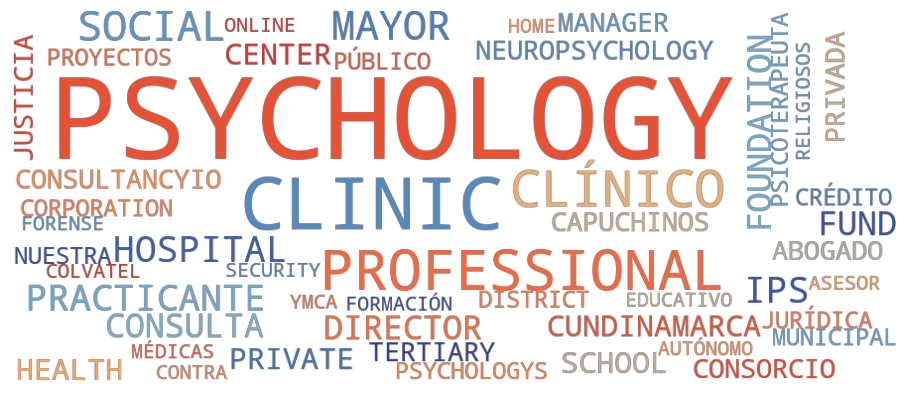

In [67]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,10,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

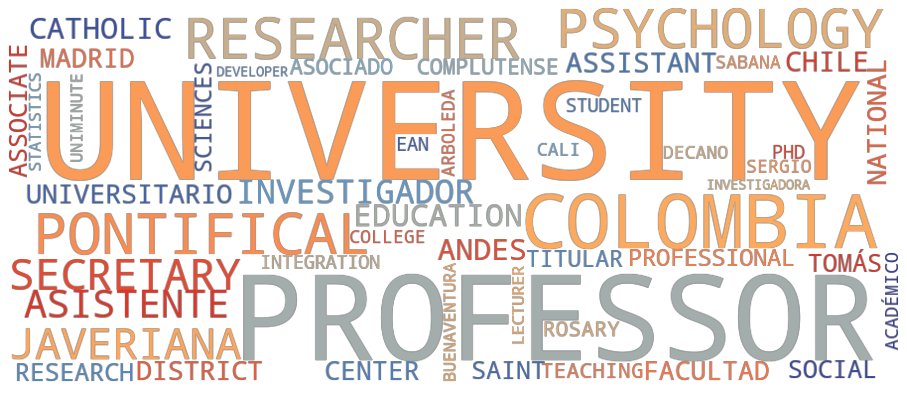

In [68]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,11,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

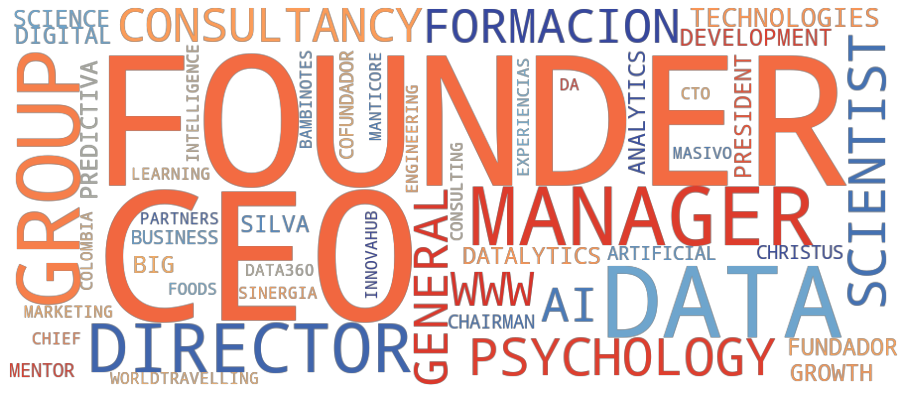

In [69]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,12,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

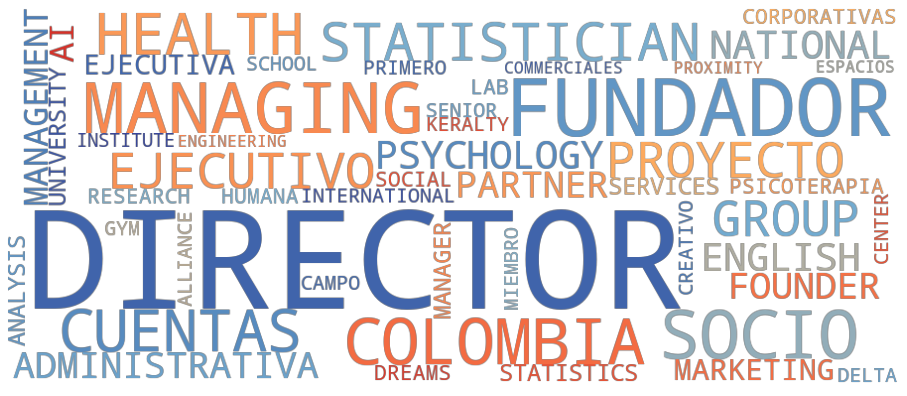

In [70]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,13,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

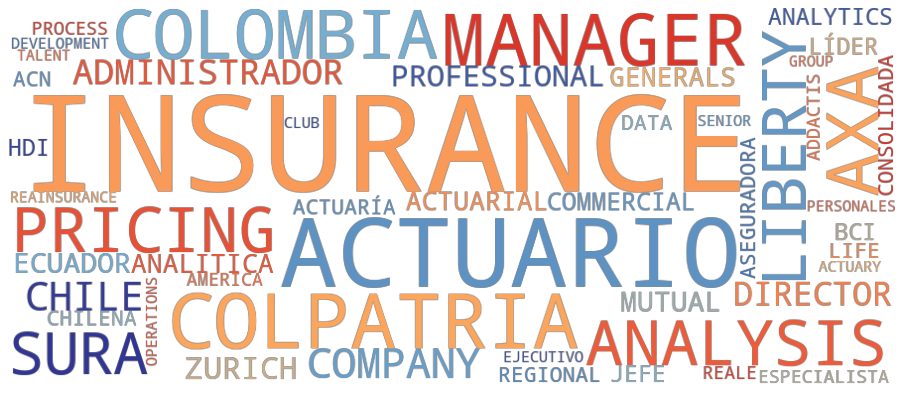

In [71]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,14,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

### DBScan

(-0.5, 899.5, 384.5, -0.5)

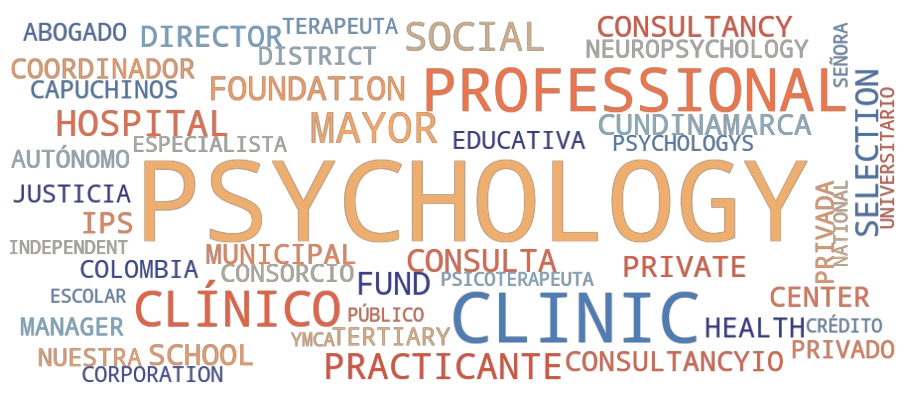

In [72]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

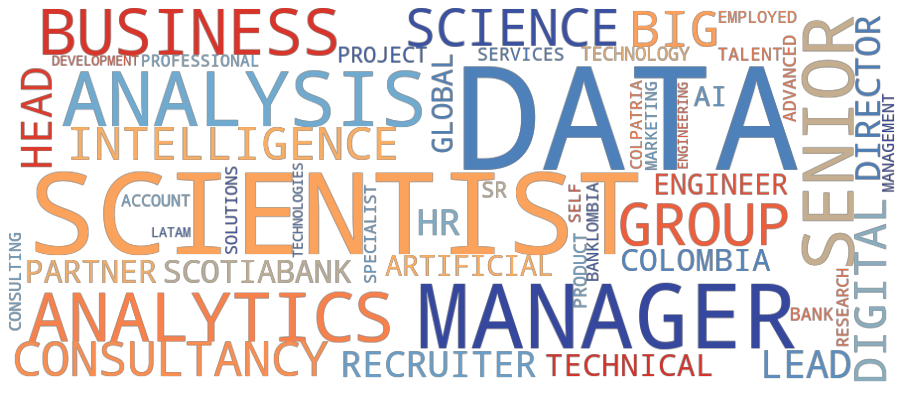

In [73]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

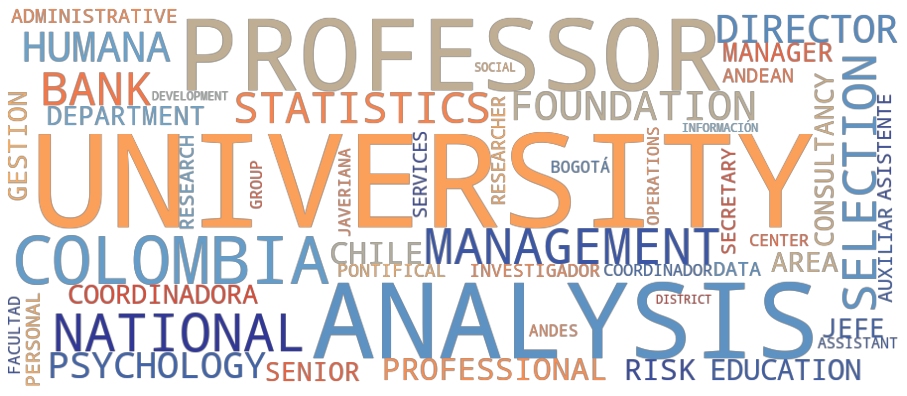

In [74]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,2,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

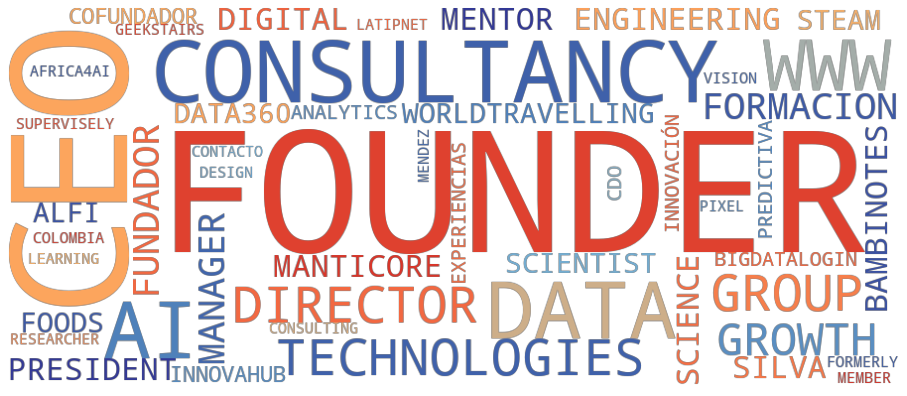

In [75]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,3,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

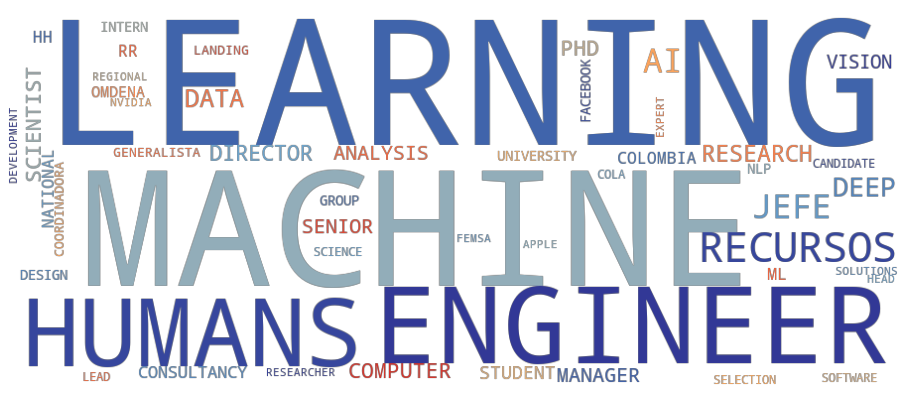

In [76]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,4,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

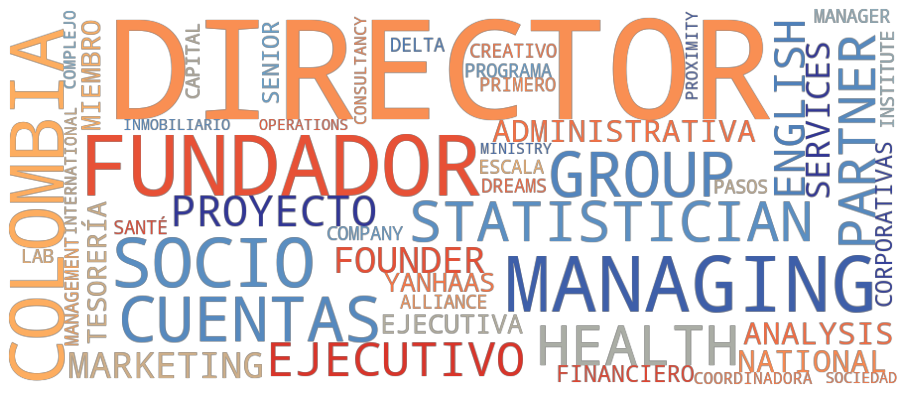

In [77]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,5,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

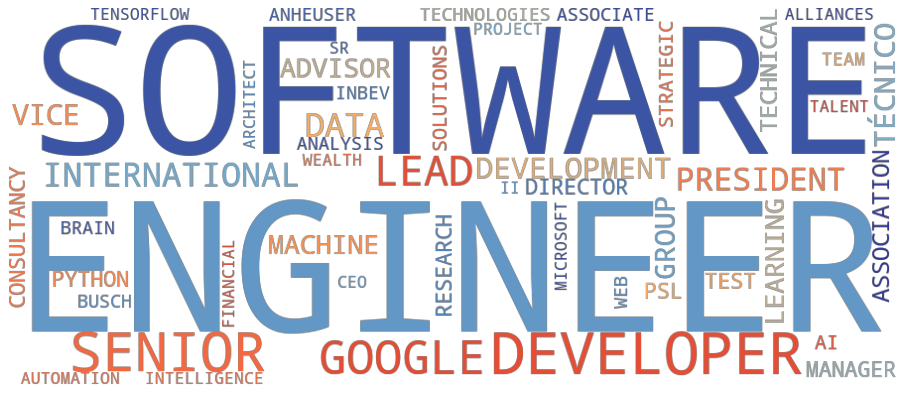

In [78]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,6,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

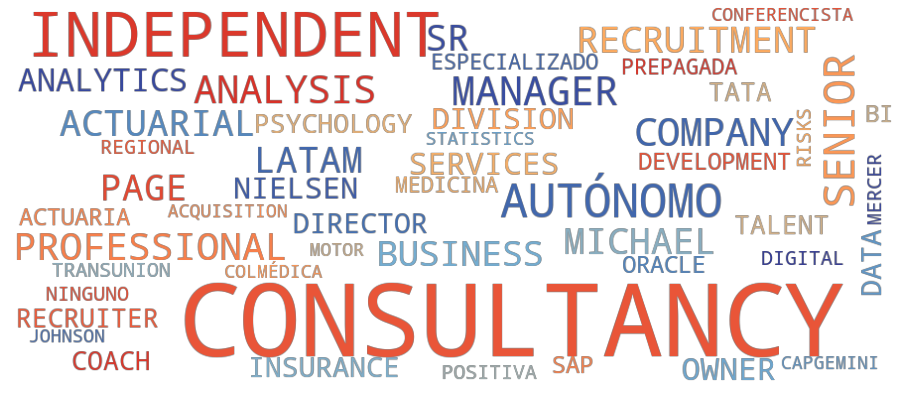

In [79]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,7,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

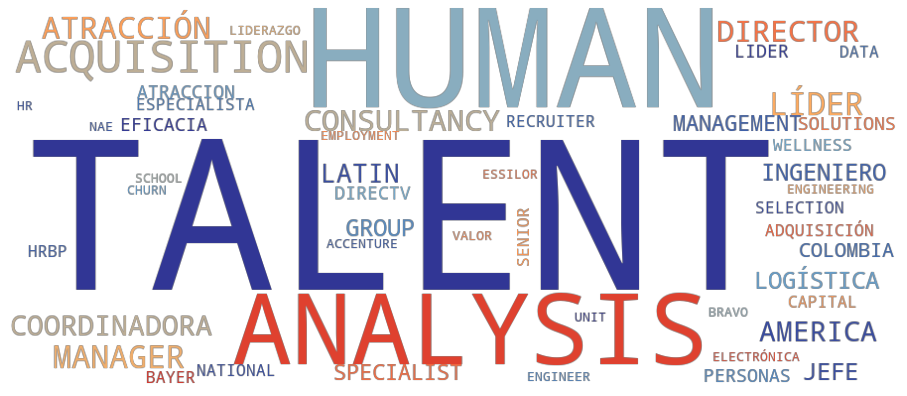

In [80]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,8,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

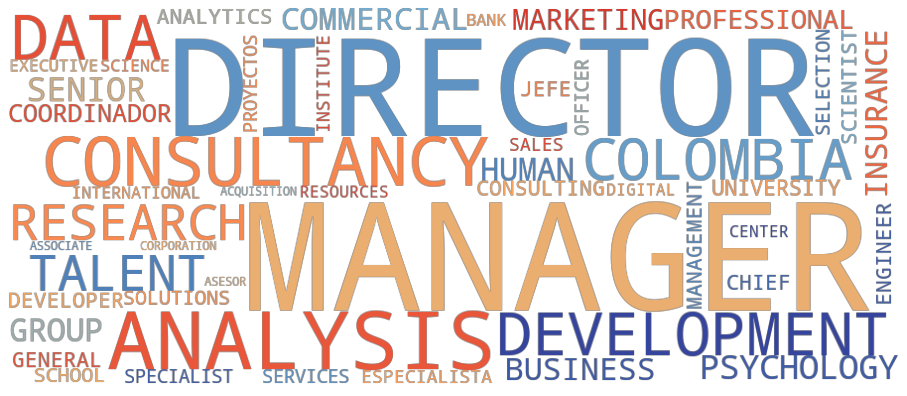

In [81]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(LDA_db_labels,-1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

In [82]:
end_exec=time.time()
print(end_exec-start_exec)

568.6997389793396


In [83]:
data["dbscan_cluster"]=LDA_db_labels
data["dendrogram_cluster"]=clustering_30d_ward.labels_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [84]:
data[[#"First Name",
      #"Last Name",
      "Position",
      #"Description",
      "dbscan_cluster","dendrogram_cluster"]].sample(25)

,Position,dbscan_cluster,dendrogram_cluster
3203,Data Scientist,1,1
6175,Senior Software Engineer,6,7
5638,Estadística,-1,0
8066,Analista de Selección,2,8
5002,Consultor actuario,-1,0
6107,Analista Category,2,3
1055,Founder & Managing Director,5,13
4366,Científico de datos senior,1,1
3038,Responsable de investigación de mercados,-1,0
2173,Executive Director,-1,0


# Checkpoint (Saving outputs)

In [0]:
data.to_csv(files_route+"data_clusters.csv")

In [0]:
output = open(files_route+'output_files.pkl', 'wb')
pickle.dump([n_grams_counts,#Matriz de ocurrencias
             LDA_embedd,#Embedding de clustering (30 dimensiones)
             spect_emb_tfidf_3,# Embedding de visualización (3 dimnensiones)
             clustering_30d_ward,#clustering dendrograma con método Ward
             db_scan_LDA# Clustering DbScan
             ], output)# Pickle dictionary using protocol 0.
output.close()

## Load data

In [0]:
data=pd.read_csv(files_route+"data_clusters.csv", index_col=0)

In [0]:
output = open(files_route+'output_files.pkl', 'rb')# Reading mode
n_grams_counts,LDA_embedd,spect_emb_tfidf_3,clustering_30d_ward,db_scan_LDA= pickle.load(output)
output.close()

In [90]:
pd.crosstab(data.dbscan_cluster, columns="count")

col_0,count
dbscan_cluster,
-1,3397
0,203
1,1509
2,1439
3,152
4,277
5,138
6,260
7,319


In [91]:
data.loc[data.dbscan_cluster==4,['Company','Position','Description']].sample(25)#'First Name','Last Name',

,Company,Position,Description
6245,Millenium BPO,Machine Learning Engineer,millenium bpo machine learning engineer
492,Emory University,PHD Candidate,emory university phd candidate
2850,Forum - Grupo BBVA,Jefe de Metodología y Herramientas,forum - group bbva jefe de metodología y herra...
6932,Iron Mountain,Senior Machine Learning Engineer,iron mountain senior machine learning engineer
7260,Matterport,Deep Learning Engineer,matterport deep learning engineer
3132,Pharmatics,Machine Learning / Software Developer,pharmatics machine learning / software developer
1877,Ingram Micro,Analista de Recursos Humanos,ingram micro analysis de recursos humans
5901,Builder,AI and Machine Learning Ninja,builder ai and machine learning ninja
6641,Facebook,AI Research,facebook ai research
1686,Snappr Inc.,Senior Machine Learning Engineer,snappr inc. senior machine learning engineer


In [92]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('data scientist', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,49
1,430
2,7
3,2
4,6
7,2


In [93]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('psychology', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,155
0,147
2,83
3,2
4,2
6,2
7,7
8,2


In [94]:
data.loc[(data.dbscan_cluster==-1)&(data.Description.str.contains('data scientist', regex=False)),
         ['Company','Position','Description']].sample(25)#'First Name','Last Name',


,Company,Position,Description
7088,IR,Advanced AI Research Engineer/Data Scientist,ir advanced ai research engineer/data scientist
5530,Colfondos S.A.,Coordinador Inteligencia de Negocios - Data Sc...,colfunds s.a. coordinador inteligencia de nego...
6815,"Data science institute, Imperial College London",Bioinformatics Data Scientist,"data science institute, imperial college londo..."
5782,Procter & Gamble,LA Retail Data Scientist,procter & gamble la retail data scientist
6666,Galvanize Inc,"Instructor, Data Scientist","galvanize inc instructor, data scientist"
3564,CASER,Data Scientist,caser data scientist
7084,Stealth-mode StartUp company,Data Scientist & Software Engineer,stealth-mode startup company data scientist & ...
3764,Salford Royal Foundation Trust,Data Scientist,salford royal foundation trust data scientist
3138,GeoDB - Geo Data Block,Chief Data Scientist,geodb - geo data block chief data scientist
1520,Banco Davivienda,Data Scientist (Profesional II),bank davivienda data scientist (professional ii)


In [95]:
print(pd.crosstab(data.dendrogram_cluster[data.Description.str.contains('data scientist', regex=False)],columns="count"))
print(pd.crosstab(data.dbscan_cluster[data.Description.str.contains('data scientist', regex=False)],columns="count"))

col_0               count
dendrogram_cluster       
0                      38
1                     383
2                      19
3                      11
4                       2
5                       1
6                      25
8                       9
9                       2
12                      5
13                      1
col_0           count
dbscan_cluster       
-1                 49
 1                430
 2                  7
 3                  2
 4                  6
 7                  2


In [96]:
print(pd.crosstab(data.dendrogram_cluster[data.Description.str.contains('psychology', regex=False)],columns="count"))
print(pd.crosstab(data.dbscan_cluster[data.Description.str.contains('psychology', regex=False)],columns="count"))

col_0               count
dendrogram_cluster       
0                     150
2                       4
3                      33
4                       3
5                       6
6                       1
7                       7
8                      19
9                      18
10                    117
11                     27
12                      7
13                      7
14                      1
col_0           count
dbscan_cluster       
-1                155
 0                147
 2                 83
 3                  2
 4                  2
 6                  2
 7                  7
 8                  2
